# 🌌 Impossible Geometry
### *Three structures that shouldn't exist — but do*

> *"Somewhere between a proof and a hallucination, mathematics hides the most violent beauty the universe has ever produced."*

---

## 📋 Series Overview

| # | Notebook | Core Idea |
|---|----------|-----------|
| 01 | **Gray-Scott Reaction-Diffusion** | Two chemicals, two equations — every pattern in nature |
| 02 | **Clifford Strange Attractor** | Four constants, six million steps, zero randomness |
| 03 | **Ulam Prime Spiral** | Primes hiding in diagonals — discovered by accident in 1963 |
| 04 | **4D Tesseract — Animated** | A hypercube rotating in two planes simultaneously |

---

## 💡 Three Profound Truths

**01 —** Simple rules produce infinite complexity. Chaos is not the absence of order — it is order we cannot compress.

**02 —** The universe has at least 4 dimensions. Every object you have ever seen is a shadow of something higher.

**03 —** Primes are not random. They obey a law no human has proved. The Riemann Hypothesis still waits.

---

*Every structure in this series emerged from equations small enough to fit on a single line.*
*The complexity was not added. It was unavoidable.*

# 🧫 Gray-Scott Reaction-Diffusion
### How leopards got their spots — from pure mathematics

`Turing Instability` · `Activator-Inhibitor` · `Morphogenesis` · `PDE Simulation`

---

## What Is Actually Happening?

### The Setup

A flat surface is coated in two invisible chemicals: **U** (prey) and **V** (predator). Both spread outward like ink in water, but V diffuses *slower* than U. Two reactions happen simultaneously:

```
U + 2V → 3V        (V converts U into more V — predator devours prey)
V → P              (V decays spontaneously — predator dies)
```

No biology. No randomness. No hand-drawn pattern. Just two chemicals obeying physics.

### The Equations

These rules encode into two coupled **partial differential equations**:

```
∂U/∂t = Dᵤ∇²U − UV² + f(1 − U)
∂V/∂t = Dᵥ∇²V + UV² − (f + k)V
```

- **∇² (Laplacian)** — the mathematical engine of diffusion; measures how different each point is from its neighbours
- **UV²** — the autocatalytic reaction term; requires one U and two V molecules to collide, making growth nonlinear

### Why Patterns Form — Turing Instability

In 1952, Alan Turing proved: if an activator spreads *slower* than its inhibitor, a tiny random fluctuation will **amplify rather than smooth out**. A local excess of V grows faster than U can diffuse in to suppress it. The uniform state spontaneously collapses into peaks and troughs.

This is **Turing instability** — the mathematical mechanism behind:
- Leopard spots and cheetah stripes
- Zebrafish pigmentation
- Fingerprint whorls
- Coral branching geometry
- Hair follicle spacing

Biology did not design these patterns. The equations did.

> **Key parameters:** `f` = feed rate (how fast U is replenished) · `k` = kill rate (how fast V decays). These two numbers control everything about the final morphology.

---

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import animation
from IPython.display import HTML, display
import warnings; warnings.filterwarnings('ignore')

plt.rcParams.update({
    'figure.facecolor':  '#03020a',
    'axes.facecolor':    '#03020a',
    'axes.edgecolor':    '#1a0a30',
    'text.color':        '#c8b8ff',
    'axes.labelcolor':   '#c8b8ff',
    'xtick.color':       '#5030a0',
    'ytick.color':       '#5030a0',
    'font.family':       'monospace',
})
print("Ready.")

Ready.


Running Gray-Scott (8,000 steps) ... done.


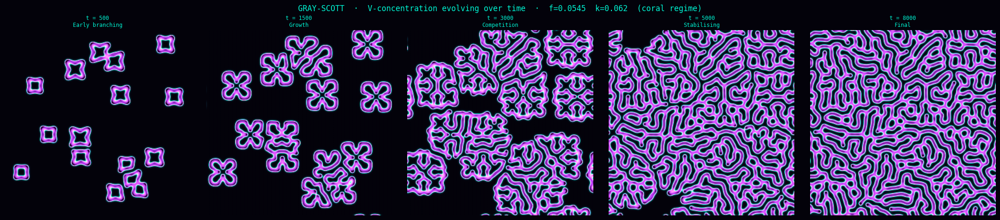

In [2]:
np.random.seed(42)
GRID, STEPS, Du, Dv = 300, 8000, 0.16, 0.08
f, k = 0.0545, 0.062   # coral / branching regime

U = np.ones((GRID, GRID))
V = np.zeros((GRID, GRID))

# Seed random perturbation patches to kick off Turing instability
for _ in range(18):
    cx, cy, r = (np.random.randint(20, GRID-20),
                 np.random.randint(20, GRID-20),
                 np.random.randint(6, 14))
    U[cy-r:cy+r, cx-r:cx+r] = 0.50 + 0.02 * np.random.randn(2*r, 2*r)
    V[cy-r:cy+r, cx-r:cx+r] = 0.25 + 0.01 * np.random.randn(2*r, 2*r)

def lap(X):
    # 5-point stencil Laplacian with periodic boundary conditions
    return (np.roll(X,1,0) + np.roll(X,-1,0) +
            np.roll(X,1,1) + np.roll(X,-1,1) - 4*X)

print("Running Gray-Scott (8,000 steps) ...", end=" ")
snaps = []
for step in range(STEPS):
    uvv = U * V * V
    U += Du * lap(U) - uvv + f * (1 - U)
    V += Dv * lap(V) + uvv - (f + k) * V
    U, V = np.clip(U, 0, 1), np.clip(V, 0, 1)
    if step in (500, 1500, 3000, 5000, STEPS-1):
        snaps.append(V.copy())
print("done.")

cgs = LinearSegmentedColormap.from_list("gs",
    ["#03020a","#0a1a2a","#003344","#00f5d4","#fff","#ff80ff","#c040ff","#1a0020"])

# ── Evolution timeline ─────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 5, figsize=(22, 5), facecolor='#03020a')
fig.subplots_adjust(left=.01, right=.99, top=.86, bottom=.06, wspace=.03)
labels = ["t = 500\nEarly branching", "t = 1500\nGrowth",
          "t = 3000\nCompetition", "t = 5000\nStabilising", "t = 8000\nFinal"]
for ax, s, lb in zip(axes, snaps, labels):
    ax.imshow(s, cmap=cgs, vmin=0, vmax=.4, interpolation='bilinear', origin='lower')
    ax.set_title(lb, color='#00f5d4', fontsize=8.5, pad=5)
    ax.axis('off')
fig.suptitle("GRAY-SCOTT  ·  V-concentration evolving over time  ·  f=0.0545  k=0.062  (coral regime)",
             color='#00f5d4', fontsize=12, y=.97)
plt.show()

---
## Parameter Space Tour

The same two equations produce completely different morphologies when `f` and `k` change.

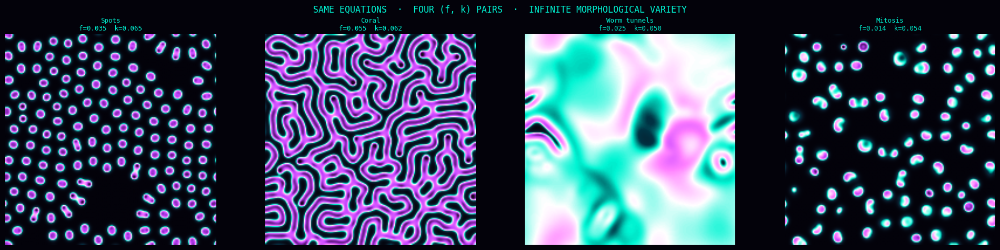

Every pattern above is identical physics. Only f and k changed.


In [3]:
# Same equations — four different (f, k) pairs
configs = [
    (0.035, 0.065, "Spots\nf=0.035  k=0.065"),
    (0.055, 0.062, "Coral\nf=0.055  k=0.062"),
    (0.025, 0.050, "Worm tunnels\nf=0.025  k=0.050"),
    (0.014, 0.054, "Mitosis\nf=0.014  k=0.054"),
]
fig2, ax2 = plt.subplots(1, 4, figsize=(20, 5), facecolor='#03020a')
fig2.subplots_adjust(left=.01, right=.99, top=.86, bottom=.06, wspace=.03)

for ax, (fi, ki, lb) in zip(ax2, configs):
    Ul = np.ones((180, 180));  Vl = np.zeros((180, 180))
    for _ in range(12):
        cx2, cy2 = np.random.randint(15,165), np.random.randint(15,165)
        Ul[cy2-8:cy2+8, cx2-8:cx2+8] = 0.5
        Vl[cy2-8:cy2+8, cx2-8:cx2+8] = 0.25
    for _ in range(6000):
        uvv2 = Ul * Vl * Vl
        Ul += Du*lap(Ul) - uvv2 + fi*(1-Ul)
        Vl += Dv*lap(Vl) + uvv2 - (fi+ki)*Vl
        Ul, Vl = np.clip(Ul,0,1), np.clip(Vl,0,1)
    ax.imshow(Vl, cmap=cgs, vmin=0, vmax=.4, interpolation='bilinear', origin='lower')
    ax.set_title(lb, color='#00f5d4', fontsize=9, pad=5)
    ax.axis('off')

fig2.suptitle("SAME EQUATIONS  ·  FOUR (f, k) PAIRS  ·  INFINITE MORPHOLOGICAL VARIETY",
              color='#00f5d4', fontsize=12, y=.97)
plt.show()
print("Every pattern above is identical physics. Only f and k changed.")

# 🌀 Clifford Strange Attractor
### 6 million chaotic steps — painting with pure determinism

`Strange Attractor` · `Fractal Geometry` · `Flame Rendering` · `Chaos Theory`

---

## What Is Actually Happening?

### The Rule

Take a point (0.1, 0.1). Apply a rule. Record where it lands. Move it again. Repeat **six million times**. Add zero randomness. The rule is the Clifford attractor — defined by four constants (a, b, c, d):

```
xₙ₊₁ = sin(a · yₙ) + c · cos(a · xₙ)
yₙ₊₁ = sin(b · xₙ) + d · cos(b · yₙ)
```

The result looks hand-drawn, organic, infinitely intricate. It is none of those things. It is four numbers.

### Why Structure Emerges — The Attractor Set

The point is **trapped**. No matter where it starts, it inevitably enters a bounded region it can never escape — the **attractor set**. Within it the point never settles, never repeats exactly, never stops. It wanders forever tracing the same ghostly skeleton.

The attractor has **fractal geometry**: zoom into any tendril and it splits into finer tendrils. Its dimension is not a whole number — around 1.6, between a curve (1D) and a filled region (2D). This is the **Hausdorff dimension**.

### The Flame Fractal Rendering Technique

Instead of drawing each point as a pixel, a 2D histogram of counters is built — one per pixel. Each time the orbit visits near a pixel, that counter increments. After six million steps:

1. **Logarithmic scale** applied — so dense ridges don't wash out delicate filaments
2. **Gamma correction** applied
3. **Colour gradient** maps density to brightness

The brightest streaks are where the attractor spends most time — the bones of the ghost image. This technique is called **flame fractal rendering**.

> **Three panels below:** same equations, three different (a, b, c, d) values — three completely different attractor shapes.

---

  Iterating 'Folded ribbon' ... done
  Iterating 'Branching tree' ... done
  Iterating 'Collapsed spiral' ... done


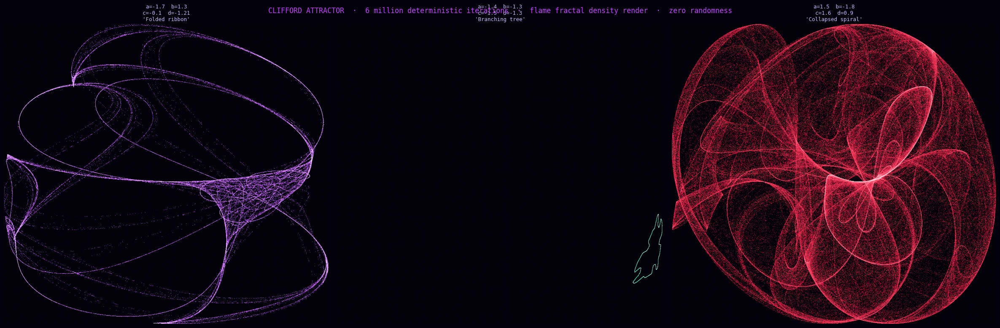

No randomness. No noise. Four numbers — infinite fractal structure.


In [4]:
def clifford_pts(a, b, c, d, n=6_000_000):
    x, y = np.float32(0.1), np.float32(0.1)
    xs, ys = np.empty(n, np.float32), np.empty(n, np.float32)
    for i in range(n):
        xs[i] = x;  ys[i] = y
        x, y = (np.sin(a*y) + c*np.cos(a*x),
                np.sin(b*x) + d*np.cos(b*y))
    return xs, ys

def hrender(xs, ys, W=1000, H=700, g=0.45):
    # Log-density histogram — flame fractal rendering
    xr = xs.max() - xs.min();  yr = ys.max() - ys.min()
    ix = np.clip(((xs-xs.min())/(xr+1e-9)*(W-1)).astype(int), 0, W-1)
    iy = np.clip(((ys-ys.min())/(yr+1e-9)*(H-1)).astype(int), 0, H-1)
    h = np.zeros((H, W), np.float32)
    np.add.at(h, (iy, ix), 1)
    h = np.log1p(h);  h /= h.max()
    return h ** g

param_sets = [
    (-1.7,  1.3, -0.1, -1.21, "a=-1.7  b=1.3\nc=-0.1  d=-1.21\n'Folded ribbon'"),
    (-1.4, -1.3, -1.5,  -1.3, "a=-1.4  b=-1.3\nc=-1.5  d=-1.3\n'Branching tree'"),
    ( 1.5, -1.8,  1.6,   0.9, "a=1.5  b=-1.8\nc=1.6  d=0.9\n'Collapsed spiral'"),
]
cmaps = [
    LinearSegmentedColormap.from_list("c1", ["#03020a","#1a0030","#6010c0","#c040ff","#fff"]),
    LinearSegmentedColormap.from_list("c2", ["#03020a","#001a10","#006040","#00f5a0","#fff"]),
    LinearSegmentedColormap.from_list("c3", ["#03020a","#200010","#800020","#ff4060","#fff"]),
]

fig, axes = plt.subplots(1, 3, figsize=(24, 8), facecolor='#03020a')
fig.subplots_adjust(left=.01, right=.99, top=.92, bottom=.03, wspace=.03)

for ax, (a,b,c,d,lb), cm in zip(axes, param_sets, cmaps):
    print(f"  Iterating {lb.split(chr(10))[2]} ...", end=" ", flush=True)
    xs, ys = clifford_pts(a, b, c, d)
    h = hrender(xs, ys)
    print("done")
    ax.imshow(h, cmap=cm, origin='lower', aspect='auto', interpolation='bilinear')
    ax.set_title(lb, color='#c8b8ff', fontsize=9, pad=5)
    ax.axis('off')

fig.suptitle("CLIFFORD ATTRACTOR  ·  6 million deterministic iterations  ·  flame fractal density render  ·  zero randomness",
             color='#c040ff', fontsize=12, y=.97)
plt.show()
print("No randomness. No noise. Four numbers — infinite fractal structure.")

# 🔢 Ulam Prime Spiral
### Primes hiding in diagonals — discovered by accident in 1963

`Number Theory` · `Quadratic Polynomials` · `Fourier Analysis` · `Unsolved Mathematics`

---

## What Is Actually Happening?

### The Accidental Discovery

In 1963, Stanisław Ulam was sitting through a dull conference lecture. He doodled on a notepad — integers in a clockwise outward spiral — then circled the primes. He immediately ran it on a Los Alamos computer.

**The primes were lining up along diagonals.** Not every prime — but far more than chance would predict if primes were truly random.

### Why Diagonals Appear

In the spiral layout, every diagonal corresponds to integers of the form **an² + bn + c** for fixed (a, b, c). Each diagonal is exactly a quadratic polynomial. If that polynomial generates prime-dense output, its diagonal lights up.

Euler's famous example:
```
n² − n + 41   is prime for every n from 0 to 40

n=0:  41  ✓      n=1:  41  ✓      n=10: 131 ✓
n=20: 421 ✓      n=40: 1601 ✓
n=41: 1681 = 41 × 41   ✗   (the streak finally breaks)
```

This polynomial appears as a bright diagonal streak in the spiral. No one designed it — it emerges from arithmetic.

### The Fourier Proof

The 2D Discrete Fourier Transform of the prime grid converts the spatial pattern into frequency components. If primes were truly random, the power spectrum would be a **featureless uniform disk**. Instead, it shows sharp off-axis spikes at the diagonal angles — mathematically proving the structure is a genuine arithmetical periodicity, not an optical illusion.

### The Open Mystery

The **Bateman-Horn conjecture** predicts the asymptotic prime density of any polynomial but has never been proved. The **Riemann Hypothesis**, after 166 years, still waits.

> **Three panels below:** full spiral · centre zoom showing individual diagonals · Fourier power spectrum proving they're real

---

Building Ulam spiral (601×601 = 361,201 integers) ... done.  30,835 primes  (8.5% of range)


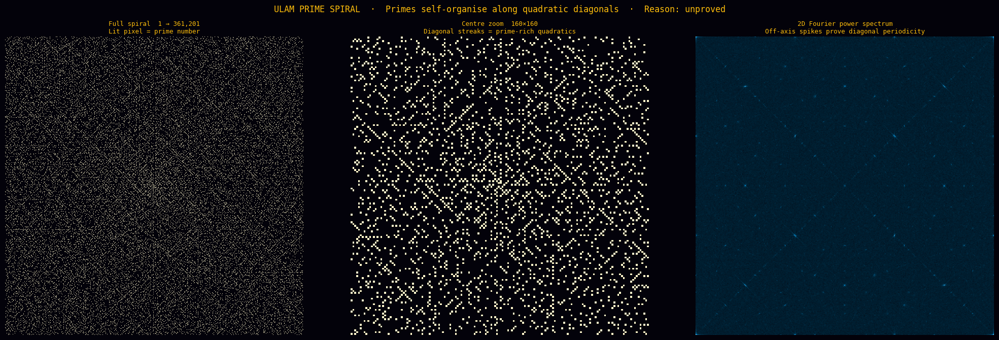

Primes are not random.
The Riemann Hypothesis would partially explain why. After 166 years — still open.


In [5]:
def sieve(n):
    p = np.ones(n+1, dtype=bool)
    p[0] = p[1] = False
    for i in range(2, int(n**0.5)+1):
        if p[i]: p[i*i::i] = False
    return p

def build_ulam(side=601):
    # Arrange integers 1..side² in clockwise outward spiral,
    # mark each cell 1 if its integer is prime, else 0.
    N = side * side
    primes = sieve(N + 4)
    grid = np.zeros((side, side), np.float32)
    x = y = side // 2
    n = 1;  step = 1;  count = 0;  di = 0;  turns = 0
    dirs = [(0,1), (-1,0), (0,-1), (1,0)]   # right, up, left, down
    for _ in range(N):
        if 0 <= y < side and 0 <= x < side and primes[n]:
            grid[y, x] = 1.0
        dx, dy = dirs[di % 4]
        x += dx;  y += dy;  n += 1;  count += 1
        if count == step:
            count = 0;  di += 1;  turns += 1
            if turns % 2 == 0: step += 1
    return grid

print("Building Ulam spiral (601×601 = 361,201 integers) ...", end=" ")
grid = build_ulam(601)
pc = int(grid.sum())
print(f"done.  {pc:,} primes  ({100*pc/601**2:.1f}% of range)")

cu = LinearSegmentedColormap.from_list("ul",
    ["#03020a","#1a0a00","#804000","#ffbe0b","#fff7cc"])

fig, axes = plt.subplots(1, 3, figsize=(21, 7), facecolor='#03020a')
fig.subplots_adjust(left=.02, right=.98, top=.88, bottom=.04, wspace=.04)

# Full spiral
axes[0].imshow(grid, cmap=cu, origin='lower', interpolation='nearest')
axes[0].set_title("Full spiral  1 → 361,201\nLit pixel = prime number",
                  color='#ffbe0b', fontsize=9, pad=5)
axes[0].axis('off')

# Centre zoom
c = 601 // 2;  z = 80
axes[1].imshow(grid[c-z:c+z, c-z:c+z], cmap=cu, origin='lower', interpolation='nearest')
axes[1].set_title("Centre zoom  160×160\nDiagonal streaks = prime-rich quadratics",
                  color='#ffbe0b', fontsize=9, pad=5)
axes[1].axis('off')

# 2D Fourier power spectrum
from numpy.fft import fft2, fftshift
spec = np.abs(fftshift(fft2(grid - grid.mean()))) ** 0.3
cf = LinearSegmentedColormap.from_list("ft", ["#03020a","#002a40","#00aaff","#fff"])
axes[2].imshow(spec, cmap=cf, origin='lower', interpolation='bilinear')
axes[2].set_title("2D Fourier power spectrum\nOff-axis spikes prove diagonal periodicity",
                  color='#ffbe0b', fontsize=9, pad=5)
axes[2].axis('off')

fig.suptitle("ULAM PRIME SPIRAL  ·  Primes self-organise along quadratic diagonals  ·  Reason: unproved",
             color='#ffbe0b', fontsize=12, y=.97)
plt.show()
print("Primes are not random.")
print("The Riemann Hypothesis would partially explain why. After 166 years — still open.")

# 🔷 4D Tesseract — Animated
### A hypercube rotating simultaneously in the XW and YZ planes

`4D Geometry` · `Dual Projection` · `Quasiperiodic Rotation` · `Higher Dimensions`

---

## What Is Actually Happening?

### Building Up from 1D to 4D

Each dimension is built by duplicating the previous shape and connecting all corresponding corners:

| Dimension | Name | Vertices | Edges | Faces | 3-Cells |
|-----------|------|----------|-------|-------|---------|
| 1D | Line segment | 2 | 1 | — | — |
| 2D | Square | 4 | 4 | 1 | — |
| 3D | Cube | 8 | 12 | 6 | 1 |
| **4D** | **Tesseract** | **16** | **32** | **24** | **8 full cubes** |

The tesseract has **eight cubic cells** — each face is a full 3D cube, just as each face of a cube is a full 2D square. All eight cubes are the same size in 4D space.

### How the Rotation Works

In 3D there are 3 independent rotation planes (XY, XZ, YZ). In 4D there are **six**: XY, XZ, XW, YZ, YW, ZW — where W is the fourth spatial axis. This animation applies two simultaneously:

```
R₁ : rotation in the XW plane at angular rate t      (mixes X and W coordinates)
R₂ : rotation in the YZ plane at angular rate 1.3t   (mixes Y and Z coordinates)
R  = R₂ · R₁   applied to all 16 vertices per frame
```

The two speeds (1.0 and 1.3) are chosen so the animation traces a dense set of orientations — never exactly repeating.

### The Double Projection

We collapse 4D → 2D in two stages:

1. **4D perspective divide on W** — points farther in W appear smaller (like 3D depth perspective), collapsing 4D → 3D. This produces the apparent "inner cube" (far in W) and "outer cube" (near in W).
2. **Orthographic drop of Z** — 3D → 2D for display.

### The "Inner Cube Popping Through" Mystery

This is not a rendering glitch. In 4D, those cubic cells are connected in a way that has no 3D analogue. As different cells rotate to the "front" of the W axis, their projected sizes rapidly exchange. In 4D space it is completely smooth and non-self-intersecting.

> The confusion you feel watching this is geometrically accurate. Your brain evolved to parse 3D scenes. Every time it locks on to a 3D interpretation, the rotation invalidates it — because this is not a 3D object. That feeling of oscillating confusion is exactly what a 4D rotation looks like from inside a 3D brain.

---

In [6]:
# 16 vertices of the tesseract: all (±1, ±1, ±1, ±1) combinations
verts4 = np.array([[x,y,z,w]
                   for x in (-1,1) for y in (-1,1)
                   for z in (-1,1) for w in (-1,1)], dtype=float)

# Edges: pairs of vertices differing in exactly ONE coordinate
edges = [(i,j) for i in range(16) for j in range(i+1,16)
         if np.sum(verts4[i] != verts4[j]) == 1]

print(f"Tesseract geometry: {len(verts4)} vertices, {len(edges)} edges  (expected: 16v, 32e)")

def rot4d(t):
    # Simultaneous rotation: XW-plane at rate t, YZ-plane at rate 1.3t
    c1, s1 = np.cos(t),       np.sin(t)
    c2, s2 = np.cos(t * 1.3), np.sin(t * 1.3)
    Rxw = np.array([[ c1, 0, 0, s1],
                    [  0, 1, 0,  0],
                    [  0, 0, 1,  0],
                    [-s1, 0, 0, c1]])
    Ryz = np.array([[1,   0,   0, 0],
                    [0,  c2,  s2, 0],
                    [0, -s2,  c2, 0],
                    [0,   0,   0, 1]])
    return Ryz @ Rxw

def project(v, dist=3.5):
    # Stage 1: 4D perspective divide on W axis
    pts = v.copy()
    w   = pts[:, 3]
    s   = 1.0 / (dist - w)          # points far in W appear smaller
    p3  = pts[:, :3] * s[:, None]   # collapse 4D → 3D
    # Stage 2: orthographic drop of Z (3D → 2D)
    return p3[:, :2], p3[:, 2]

FRAMES = 90
fig, ax = plt.subplots(figsize=(9, 9), facecolor='#03020a')
ax.set_facecolor('#03020a')
ax.set_aspect('equal')
ax.axis('off')
ax.set_xlim(-2.2, 2.2);  ax.set_ylim(-2.2, 2.2)
ax.set_title("4D TESSERACT  ·  Simultaneous XW × YZ rotation\n"
             "Edge brightness = depth after 4D→3D projection",
             color='#3a86ff', fontsize=11, pad=10)

lo = [ax.plot([], [], lw=1.2, alpha=0.0)[0] for _ in edges]
do = [ax.plot([], [], 'o', ms=4,  alpha=0.0)[0] for _ in range(16)]

def init():
    [l.set_data([], []) for l in lo]
    [d.set_data([], []) for d in do]
    return lo + do

def upd(f):
    t   = f / FRAMES * 2 * np.pi
    R   = rot4d(t)
    pts = (R @ verts4.T).T
    xy, zv = project(pts)
    dep = (zv - zv.min()) / (zv.max() - zv.min() + 1e-9)
    for obj, (i, j) in zip(lo, edges):
        da = (dep[i] + dep[j]) / 2
        obj.set_data([xy[i,0], xy[j,0]], [xy[i,1], xy[j,1]])
        obj.set_color((da*0.3, da*0.6, 1.0 - da*0.7))
        obj.set_alpha(0.35 + 0.65*da)
        obj.set_linewidth(0.7 + 1.5*da)
    for obj, k in zip(do, range(16)):
        obj.set_data([xy[k,0]], [xy[k,1]])
        obj.set_color((0.5 + 0.5*dep[k], 0.5*dep[k], 1.0))
        obj.set_alpha(0.6 + 0.4*dep[k])
        obj.set_markersize(3 + 4*dep[k])
    return lo + do

anim = animation.FuncAnimation(fig, upd, frames=FRAMES,
                                init_func=init, interval=50, blit=True)
plt.close()
display(HTML(anim.to_jshtml(fps=20, default_mode='loop')))

print("The inner cube popping through the outer is not a glitch.")
print("In 4D, those cells connect in a way no 3D analogy can describe.")

Tesseract geometry: 16 vertices, 32 edges  (expected: 16v, 32e)


The inner cube popping through the outer is not a glitch.
In 4D, those cells connect in a way no 3D analogy can describe.


---

## 💡 Three Profound Truths

**01 —** Simple rules produce infinite complexity. Chaos is not the absence of order — it is order we cannot compress.

**02 —** The universe has at least 4 dimensions. Every object you have ever seen is a shadow of something higher.

**03 —** Primes are not random. They obey a law no human has proved. The Riemann Hypothesis still waits.

---
*▸ end of descent ◂*